In [30]:
import pygmt 
from numpy.random import randint
import xarray as xr
import numpy as np
import getpass
import pandas as pd



In [31]:
Volc = pd.read_csv (r'/Users/seismo_reynier/Documents/two_volc.csv')
Stat = pd.read_csv (r'/Users/seismo_reynier/Documents/stations2.csv')
Shocks = pd.read_csv (r'/Users/seismo_reynier/Documents/after_shocks.csv')
Stat.head()

,stations,longitude,latitude
0,VICA,-83.844597,9.9845
1,VTCE,-83.756798,10.0246
2,VTCG,-83.758598,10.0147
3,VTCV,-83.726700,9.9831
4,VTLA,-83.775200,10.0027


In [32]:
BATAN = [-83.376099, 10.0978]
CDM = [-83.763702, 9.5537]
RIFO = [-83.922798, 10.3172]
HDC3 = [-84.111397, 10.0021]
RIFO = [-83.922798, 10.3172]
VICA = [-83.844597, 9.9845]
OCM = [-83.962303, 9.8941]
RIMA = [-83.863602, 9.7666]
VPTE = [-84.198502, 10.1718]
VTCE = [-83.756798, 10.0246]
VTCG = [-83.758598, 10.0147]
VTCV = [-83.7267, 9.9831]
VTLA = [-83.7752, 10.0027]
VTRT = [-83.792702, 10.002]
VTUC = [-83.762001, 10.024]
VTUN = [-83.7635, 10.0226]

In [33]:
#Map 1 for filter 3 and zz component for EQ event 


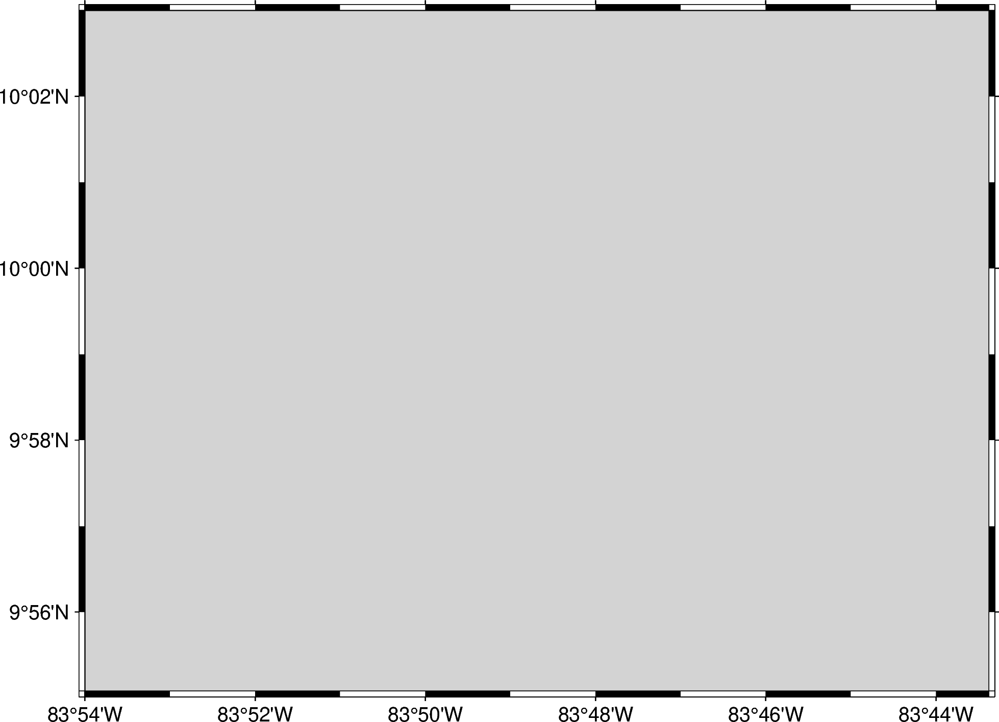

In [145]:
fig = pygmt.Figure()
fig.coast(
    region=[-83.9,-83.723,9.918,10.05],                #[xmin, xmax, ymin, ymax] #[-83.852,-83.720,9.943,10.021])
    projection='M15c',           # 4 inches mercator projection     #'a0.2i' star symbol
    shorelines="0.5p,black",
    borders=["1/2p,black"],
    water='lightblue',
    land='lightgrey',
    frame=True,       #['a','+t"Station map"'],
    resolution='f', 
)

fig.show()

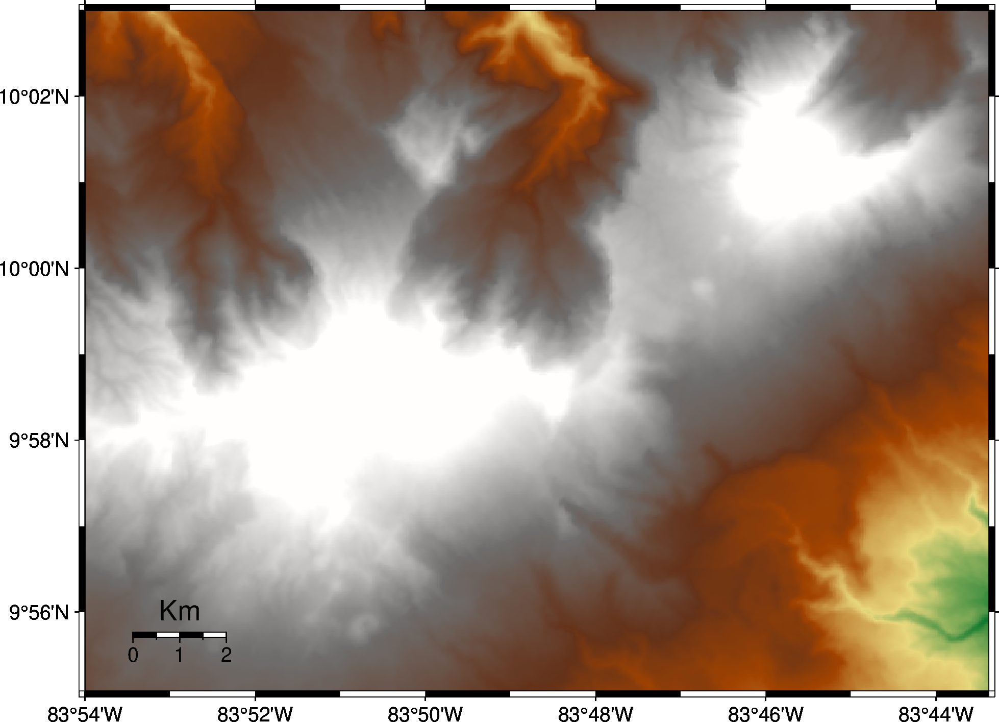

In [146]:
fig.grdimage(
    grid="@earth_relief_01s",
    cmap="geo",     #haxby topo earth world
    projection='M15c',
    frame=True,
)
fig.coast(
    region=[-83.9,-83.723,9.918,10.05],                #[xmin, xmax, ymin, ymax]
    projection='M15c',           # 4 inches mercator projection     #'a0.2i' star symbol
    shorelines="0.5p,black",
    borders=["1/0.5p,black"],
    #water='lightblue',
    #land='lightgrey',
    frame=True,    #['a','+t"Station map"'],
    map_scale="jBL+w2k+f+o0.8c/0.8c+lKm",
    resolution='f',
)
fig.show()

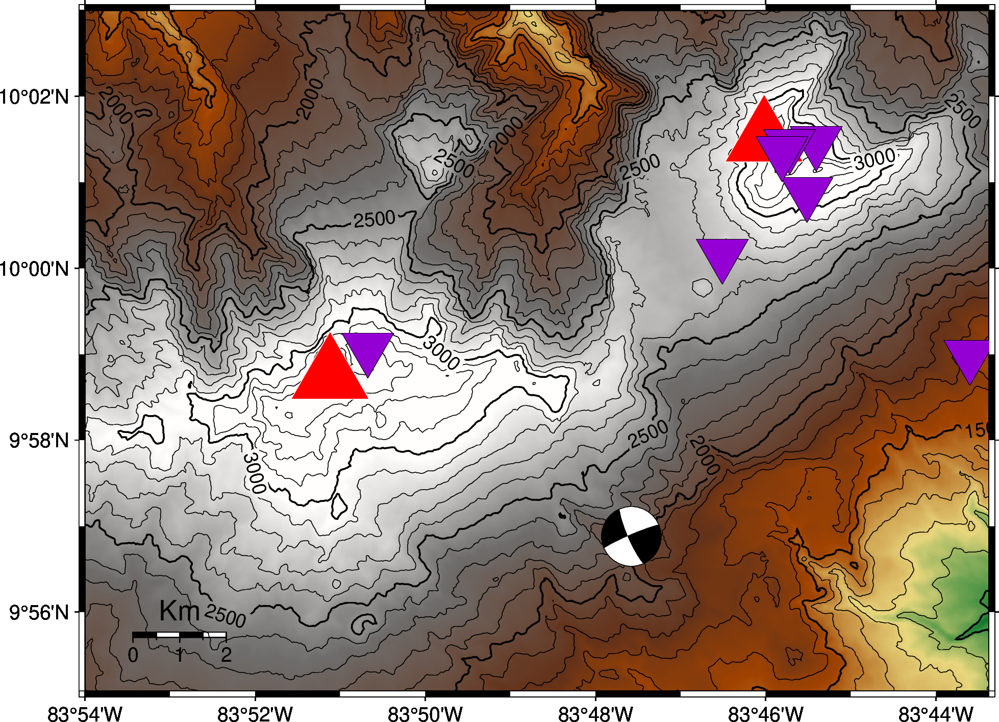

In [147]:
fig.grdcontour(
    annotation=250,
    interval=100,
    grid="@earth_relief_01s",
    limit=[-2000, 8000],
    projection='M15c',
    frame=True,
)
fig.plot(
    x=Volc.longitude,
    y=Volc.latitude,
    style="t1.5c",
    #style="kvolcano/0.6c", 
    pen="0.2p,white", 
    color='red',    
    label="Turrialba and Irazu",
    #cmap=True,
)
fig.plot(
    x=Stat.longitude,
    y=Stat.latitude,
    style="i1c",
    pen="0.1,black",
    color="darkviolet",
    #label="Seismic Stations"
)
focal_mechanism = dict(strike=247, dip=85, rake=9, magnitude=5.5)
fig.meca(focal_mechanism, scale="0.9c", longitude=-83.793, latitude=9.948, depth=1.5)
#fig.colorbar(position="JMT", cmap=True, frame=["af", "x+lElevation", "y+lm"]) #JMT+o1c/1c+w7c/0.5c
fig.show()

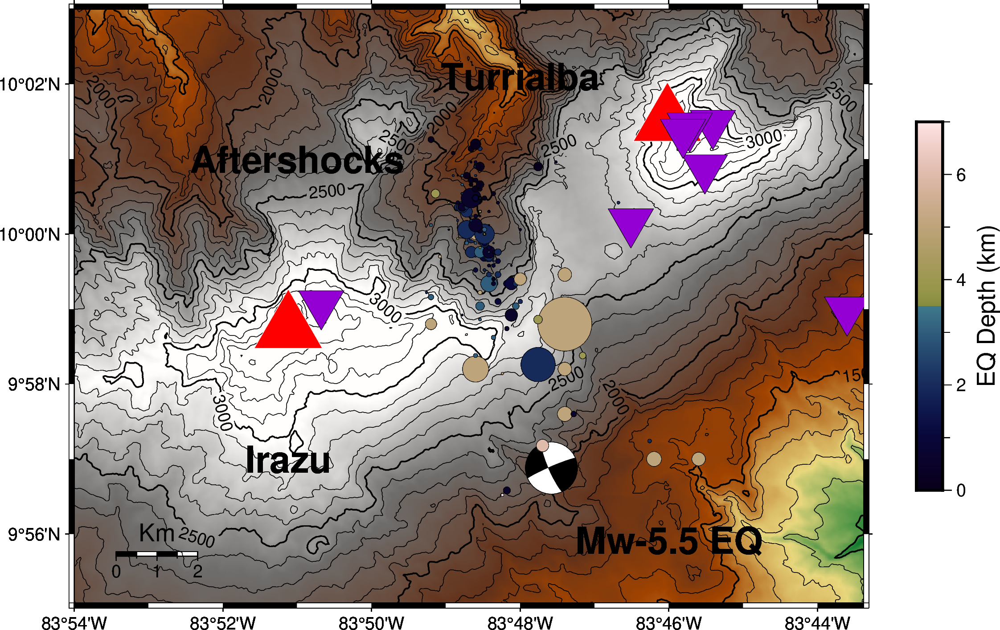

In [149]:
pygmt.makecpt(cmap="nighttime", series=[Shocks.Depth.min(), Shocks.Depth.max()])
fig.plot(
    x=Shocks.longitude,
    y=Shocks.latitude,
    size=0.02 * (2.5**Shocks.Mag),
    color=Shocks.Depth,
    style="cc",
    cmap=True,
    pen="0.1p,black",
    #style="p0.2c",
    #style="kvolcano/0.6c", 
    #label='Aftershocks',
)
fig.colorbar(position="JMR+o1c/0c+w7c/0.5c", frame='af+l"EQ Depth (km)"') #SET T JMR+o1c/0c+mc
fig.text(text=["Irazu"], x=[-83.852], y=[9.95], font="20p,Helvetica-Bold,black") 
fig.text(text=["Turrialba"], x=[-83.80], y=[10.035], font="20p,Helvetica-Bold,black") 
fig.text(text=["Mw-5.5 EQ"], x=[-83.7666], y=[9.932], font="20p,Helvetica-Bold,black")
fig.text(text=["Aftershocks"], x=[-83.8500], y=[10.0166], font="20p,Helvetica-Bold,black") 
fig.show()

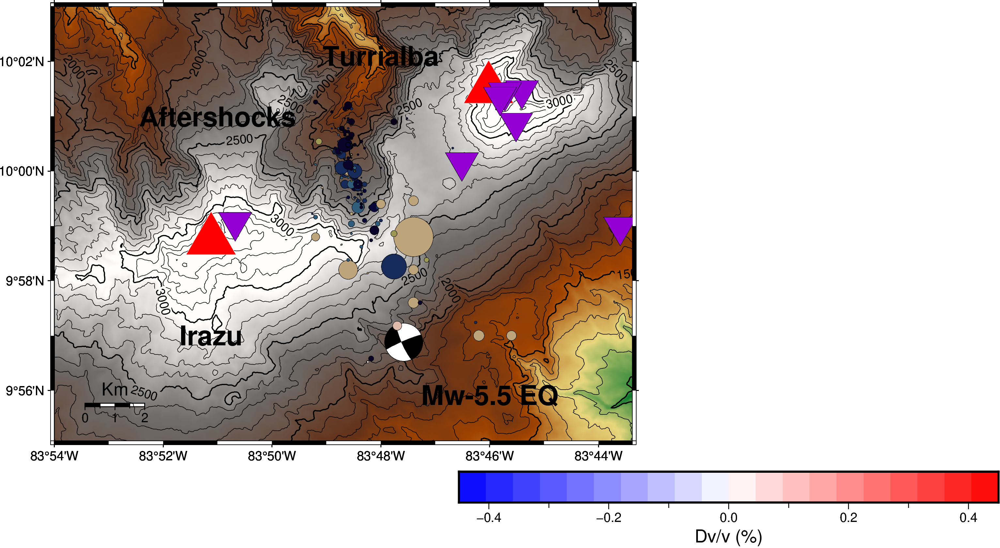

In [142]:
pygmt.makecpt(series=[-0.45, 0.45, 0.045], cmap="polar")
fig.colorbar(cmap=True, position="JMB+o10c/0.8c+w14c/0.8c", frame='af+l"Dv/v (%)"')
fig.show()

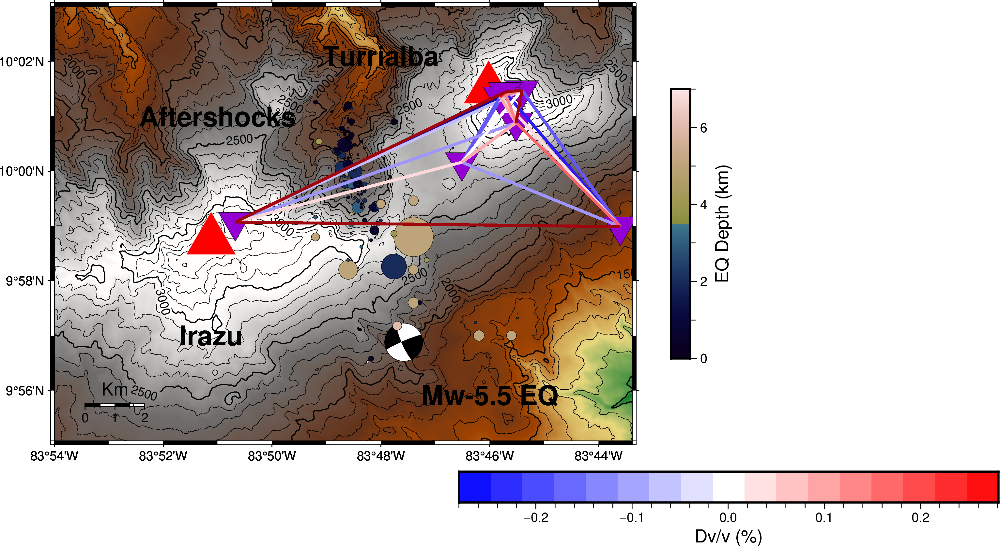

In [125]:
#F7-TT-EQ
data1 = np.array([VICA+VTUN])
data2 = np.array([VICA+VTCE])
data3 = np.array([VTCV+VTUC])
data4 = np.array([VTCE+VTCV])
data5 = np.array([VTLA+VTUN])
data6 = np.array([VICA+VTCG])
data7 = np.array([VTCV+VTLA])
data8 = np.array([VTCE+VTLA])
data9 = np.array([VICA+VTLA])
data10 = np.array([VTCV+VTUN])
data11 = np.array([VTCG+VTLA])
data12 = np.array([VTCG+VTUN])
data13 = np.array([VTCG+VTUC])
data14 = np.array([VTCE+VTUN])
data15 = np.array([VTCG+VTCV])
data16 = np.array([VTUC+VTUN])
data17 = np.array([VTUC+VTUN])
data18 = np.array([VTCE+VTUC])
data19 = np.array([VICA+VTUC])
data20 = np.array([VICA+VTCV])
data21 = np.array([VTCE+VTCG])
#Blues    #Reds
#1507a5  1 #9f060e   -1
#1c09e0  1 #bf0810   -1
#2d1af5  2 #de0913   -2
#311ef6  3 #f30a15   -3
#4f3ff7  4 #f6232d   -4
#6456f8  5 #f74149   -5
#7a6ef9  6 #f9636a   -6
#9f96fb  7 #fa8288   -7
#c3bdfc  8 #fcacaf   -8
#e8e6fe  9 #fdd9db   -9
#white #ffffff
#F3-TT-EQ
fig.plot(data=data1, style="=0.4c+s", pen="2p,#1507a5")
fig.plot(data=data2, style="=0.4c+s", pen="2p,#c3bdfc")
fig.plot(data=data3, style="=0.4c+s", pen="2p,#2d1af5")
fig.plot(data=data4, style="=0.4c+s", pen="2p,#6456f8")
fig.plot(data=data5, style="=0.4c+s", pen="2p,#6456f8")
fig.plot(data=data6, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data7, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data8, style="=0.4c+s", pen="2p,#ffffff")
fig.plot(data=data9, style="=0.4c+s", pen="2p,#fdd9db")
fig.plot(data=data10, style="=0.4c+s", pen="2p,#fdd9db")
fig.plot(data=data11, style="=0.4c+s", pen="2p,#fcacaf") #fdd9db
fig.plot(data=data12, style="=0.4c+s", pen="2p,#fcacaf")
fig.plot(data=data13, style="=0.4c+s", pen="2p,#fa8288")
fig.plot(data=data14, style="=0.4c+s", pen="2p,#fa8288")
fig.plot(data=data15, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data16, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data17, style="=0.4c+s", pen="2p,#de0913")
fig.plot(data=data18, style="=0.4c+s", pen="2p,#9f060e")
fig.plot(data=data19, style="=0.4c+s", pen="2p,#9f060e")
fig.plot(data=data20, style="=0.4c+s", pen="2p,#9f060e")
fig.plot(data=data21, style="=0.4c+s", pen="2p,#9f060e")
fig.show()
fig.savefig(r'/Users/seismo_reynier/Documents/dvvmapF7TTEQ.png', dpi = 300)

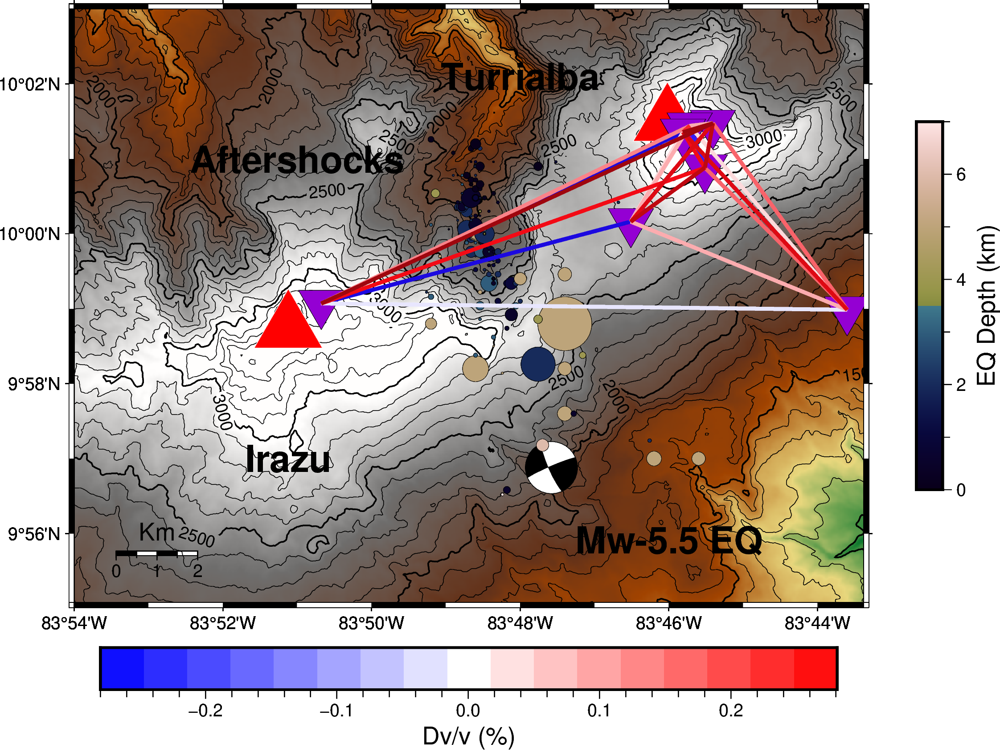

In [81]:
#F7-ZZ-EQ
data1 = np.array([VICA+VTLA])
data2 = np.array([VICA+VTUN])
data3 = np.array([VTCG+VTUC])
data4 = np.array([VICA+VTCV])
data5 = np.array([VTLA+VTUN])
data6 = np.array([VTCV+VTUC])
data7 = np.array([VTCV+VTLA])
data8 = np.array([VTCE+VTUC])
data9 = np.array([VTLA+VTUC])
data10 = np.array([VICA+VTUC])
data11 = np.array([VTCE+VTCV])
data12 = np.array([VTCG+VTCV])
data13 = np.array([VTUC+VTUN])
data14 = np.array([VTCG+VTUN])
data15 = np.array([VICA+VTCG])
data16 = np.array([VTCV+VTUN])
data17 = np.array([VTCE+VTLA])
data18 = np.array([VTCE+VTCG])
data19 = np.array([VTCG+VTLA])
data20 = np.array([VTCE+VTUN])
data21 = np.array([VICA+VTCE])
#Blues    #Reds
#1507a5  1 #9f060e   -1
#1c09e0  1 #bf0810   -1
#2d1af5  2 #de0913   -2
#311ef6  3 #f30a15   -3
#4f3ff7  4 #f6232d   -4
#6456f8  5 #f74149   -5
#7a6ef9  6 #f9636a   -6
#9f96fb  7 #fa8288   -7
#c3bdfc  8 #fcacaf   -8
#e8e6fe  9 #fdd9db   -9
#white #ffffff
#F3-TT-EQ
fig.plot(data=data1, style="=0.4c+s", pen="2p,#1c09e0")
fig.plot(data=data2, style="=0.4c+s", pen="2p,#1c09e0")
fig.plot(data=data3, style="=0.4c+s", pen="2p,#311ef6")
fig.plot(data=data4, style="=0.4c+s", pen="2p,#e8e6fe")
fig.plot(data=data5, style="=0.4c+s", pen="2p,#fdd9db")
fig.plot(data=data6, style="=0.4c+s", pen="2p,#fdd9db")
fig.plot(data=data7, style="=0.4c+s", pen="2p,#fcacaf")
fig.plot(data=data8, style="=0.4c+s", pen="2p,#fcacaf")
fig.plot(data=data9, style="=0.4c+s", pen="2p,#fcacaf")
fig.plot(data=data10, style="=0.4c+s", pen="2p,#fa8288")
fig.plot(data=data11, style="=0.4c+s", pen="2p,#f9636a") #fdd9db
fig.plot(data=data12, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data13, style="=0.4c+s", pen="2p,#f6232d")
fig.plot(data=data14, style="=0.4c+s", pen="2p,#f30a15")
fig.plot(data=data15, style="=0.4c+s", pen="2p,#f30a15")
fig.plot(data=data16, style="=0.4c+s", pen="2p,#de0913")
fig.plot(data=data17, style="=0.4c+s", pen="2p,#de0913")
fig.plot(data=data18, style="=0.4c+s", pen="2p,#bf0810")
fig.plot(data=data19, style="=0.4c+s", pen="2p,#bf0810")
fig.plot(data=data20, style="=0.4c+s", pen="2p,#9f060e")
fig.plot(data=data21, style="=0.4c+s", pen="2p,#9f060e")
fig.show()
fig.savefig(r'/Users/seismo_reynier/Documents/dvvmapF7ZZEQ.png', dpi = 300)

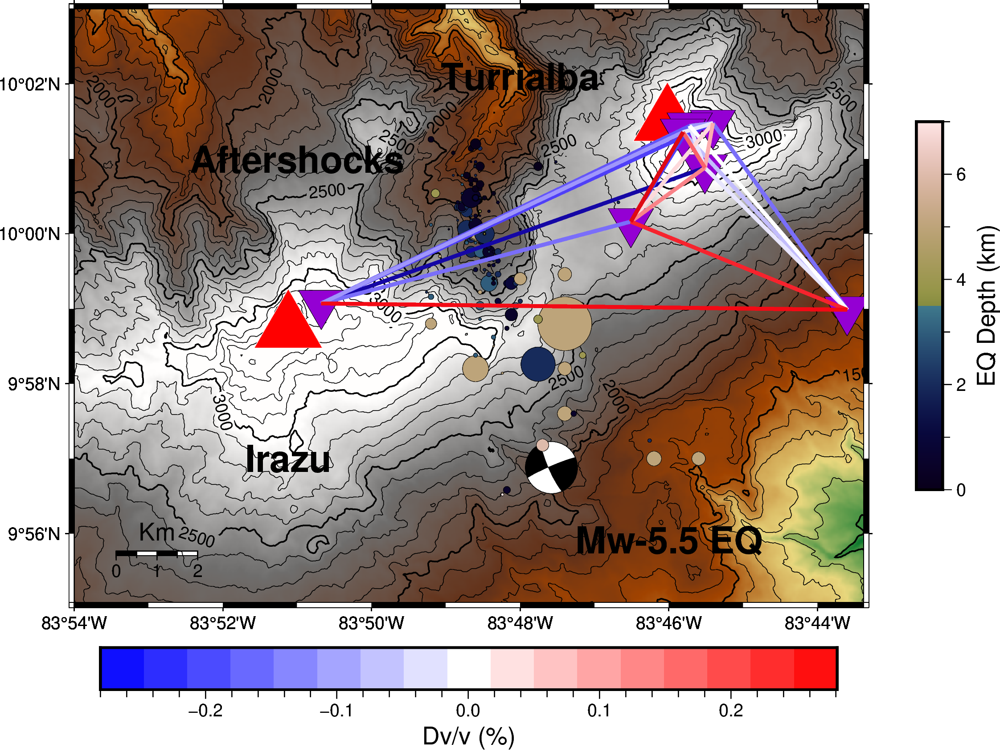

In [103]:
#F3-TT-ERUPTION
data1 = np.array([VICA+VTCG])
data2 = np.array([VTUC+VTUN])
data3 = np.array([VICA+VTCE])
data4 = np.array([VTLA+VTUC])
data5 = np.array([VICA+VTUC])
data6 = np.array([VTCE+VTCV])
data7 = np.array([VICA+VTLA])
data8 = np.array([VICA+VTUN])
data9 = np.array([VTCE+VTUC])
data10 = np.array([VTCV+VTUN])
data11 = np.array([VTCG+VTCV])
data12 = np.array([VTCG+VTUC])
data13 = np.array([VTCE+VTUN])
data14 = np.array([VTCV+VTUC])
data15 = np.array([VTCE+VTLA])
data16 = np.array([VTCE+VTCG])
data17 = np.array([VTCG+VTLA])
data18 = np.array([VTCG+VTUN])
data19 = np.array([VTCV+VTLA])
data20 = np.array([VICA+VTCV])
data21 = np.array([VTLA+VTUN])

#data1 = np.array([VICA+VTCG, VTUC+VTUN, VICA+VTCE, VTLA+VTUC, VICA+VTUC, VTCE+VTCV, VICA+VTLA,
                 VICA+VTUN, VTCE+VTUC, VTCV+VTUN, VTCG+VTCV, VTCG+VTUC, VTCE+VTUN, VTCV+VTUC, 
                 VTCE+VTLA, VTCE+VTCG, VTCG+VTLA, VTCG+VTUN, VTCV+VTLA, VICA+VTCV, VTLA+VTUN])
#Blues    #Reds
#1507a5  1 #9f060e 1  -1
#1c09e0  1 #bf0810 2  -1
#2d1af5  2 #de0913 3  -2
#311ef6  3 #f30a15 4  -3
#4f3ff7  4 #f6232d 5  -4
#6456f8  5 #f74149 6  -5
#7a6ef9  6 #f9636a 7  -6
#9f96fb  7 #fa8288 8  -7
#c3bdfc  8 #fcacaf 9  -8
#e8e6fe  9 #fdd9db 10 -9
#white #ffffff

fig.plot(data=data1, style="=0.4c+s", pen="2p,#1507a5")
fig.plot(data=data2, style="=0.4c+s", pen="2p,#1c09e0")
fig.plot(data=data3, style="=0.4c+s", pen="2p,#4f3ff7")
fig.plot(data=data4, style="=0.4c+s", pen="2p,#4f3ff7")
fig.plot(data=data5, style="=0.4c+s", pen="2p,#6456f8")
fig.plot(data=data6, style="=0.4c+s", pen="2p,#7a6ef9")
fig.plot(data=data7, style="=0.4c+s", pen="2p,#7a6ef9")
fig.plot(data=data8, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data9, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data10, style="=0.4c+s", pen="2p,#c3bdfc")
fig.plot(data=data11, style="=0.4c+s", pen="2p,#e8e6fe") #fdd9db
fig.plot(data=data12, style="=0.4c+s", pen="2p,#e8e6fe")
fig.plot(data=data13, style="=0.4c+s", pen="2p,#e8e6fe")
fig.plot(data=data14, style="=0.4c+s", pen="2p,#ffffff")
fig.plot(data=data15, style="=0.4c+s", pen="2p,#fdd9db")
fig.plot(data=data16, style="=0.4c+s", pen="2p,#fcacaf")
fig.plot(data=data17, style="=0.4c+s", pen="2p,#fa8288")
fig.plot(data=data18, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data19, style="=0.4c+s", pen="2p,#f6232d")
fig.plot(data=data20, style="=0.4c+s", pen="2p,#f30a15")
fig.plot(data=data21, style="=0.4c+s", pen="2p,#de0913")
fig.show()
fig.savefig(r'/Users/seismo_reynier/Documents/dvvmapF3TTERUPT.png', dpi = 300)

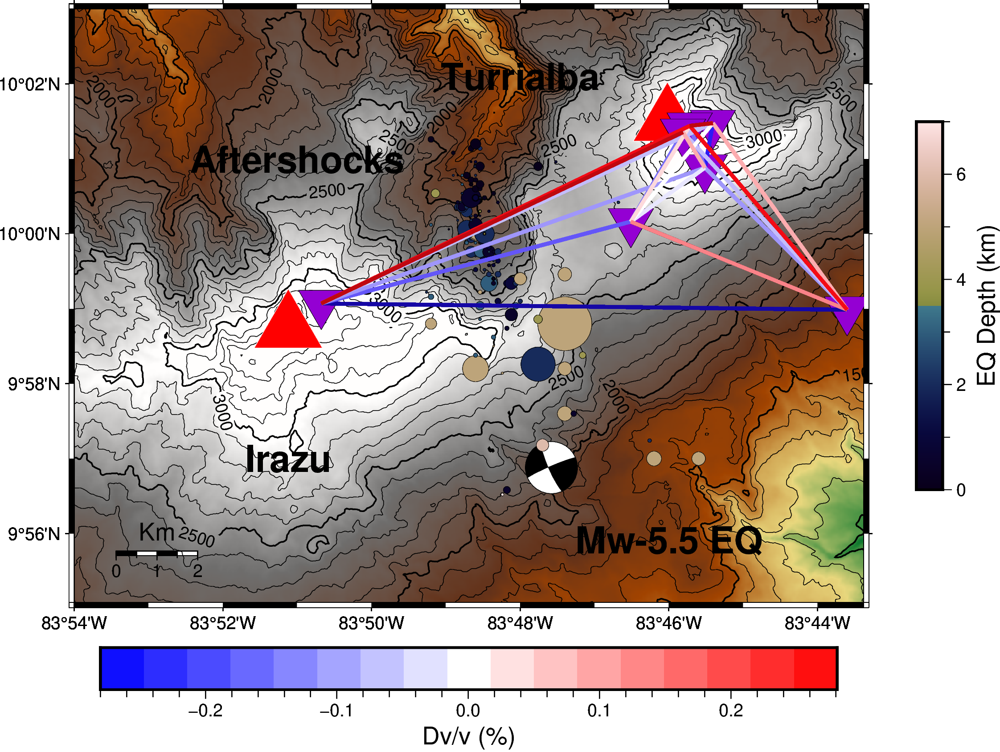

In [75]:
#F3-ZZ-ERUPTION
data1 = np.array([VICA+VTCV])
data2 = np.array([VTCE+VTCG])
data3 = np.array([VICA+VTLA])
data4 = np.array([VTLA+VTUN])
data5 = np.array([VTCG+VTUC])
data6 = np.array([VTUC+VTUN])
data7 = np.array([VICA+VTCG])
data8 = np.array([VTCG+VTCV])
data9 = np.array([VICA+VTCE])
data10 = np.array([VTCV+VTUN])
data11 = np.array([VTCE+VTUN])
data12 = np.array([VTCG+VTLA])
data13 = np.array([VTCE+VTLA])
data14 = np.array([VTLA+VTUC])
data15 = np.array([VTCE+VTCV])
data16 = np.array([VTCG+VTUN])
data17 = np.array([VTCV+VTLA])
data18 = np.array([VICA+VTUC])
data19 = np.array([VTCV+VTUC])
data20 = np.array([VICA+VTUN])
data21 = np.array([VTCE+VTUC])
#Blues    #Reds
#1507a5  1 #9f060e 1  -1
#1c09e0  1 #bf0810 2  -1
#2d1af5  2 #de0913 3  -2
#311ef6  3 #f30a15 4  -3
#4f3ff7  4 #f6232d 5  -4
#6456f8  5 #f74149 6  -5
#7a6ef9  6 #f9636a 7  -6
#9f96fb  7 #fa8288 8  -7
#c3bdfc  8 #fcacaf 9  -8
#e8e6fe  9 #fdd9db 10 -9
#white #ffffff
#F3-TT-EQ
fig.plot(data=data1, style="=0.4c+s", pen="2p,#1507a5")
fig.plot(data=data2, style="=0.4c+s", pen="2p,#2d1af5")
fig.plot(data=data3, style="=0.4c+s", pen="2p,#6456f8")
fig.plot(data=data4, style="=0.4c+s", pen="2p,#7a6ef9")
fig.plot(data=data5, style="=0.4c+s", pen="2p,#7a6ef9")
fig.plot(data=data6, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data7, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data8, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data9, style="=0.4c+s", pen="2p,#c3bdfc")
fig.plot(data=data10, style="=0.4c+s", pen="2p,#c3bdfc")
fig.plot(data=data11, style="=0.4c+s", pen="2p,#c3bdfc") #fdd9db
fig.plot(data=data12, style="=0.4c+s", pen="2p,#e8e6fe")
fig.plot(data=data13, style="=0.4c+s", pen="2p,#ffffff")
fig.plot(data=data14, style="=0.4c+s", pen="2p,#fdd9db")
fig.plot(data=data15, style="=0.4c+s", pen="2p,#fcacaf")
fig.plot(data=data16, style="=0.4c+s", pen="2p,#fcacaf")
fig.plot(data=data17, style="=0.4c+s", pen="2p,#fa8288")
fig.plot(data=data18, style="=0.4c+s", pen="2p,#f30a15")
fig.plot(data=data19, style="=0.4c+s", pen="2p,#f30a15")
fig.plot(data=data20, style="=0.4c+s", pen="2p,#bf0810")
fig.plot(data=data21, style="=0.4c+s", pen="2p,#bf0810")
fig.show()
fig.savefig(r'/Users/seismo_reynier/Documents/dvvmapF3ZZERUPT.png', dpi = 300)

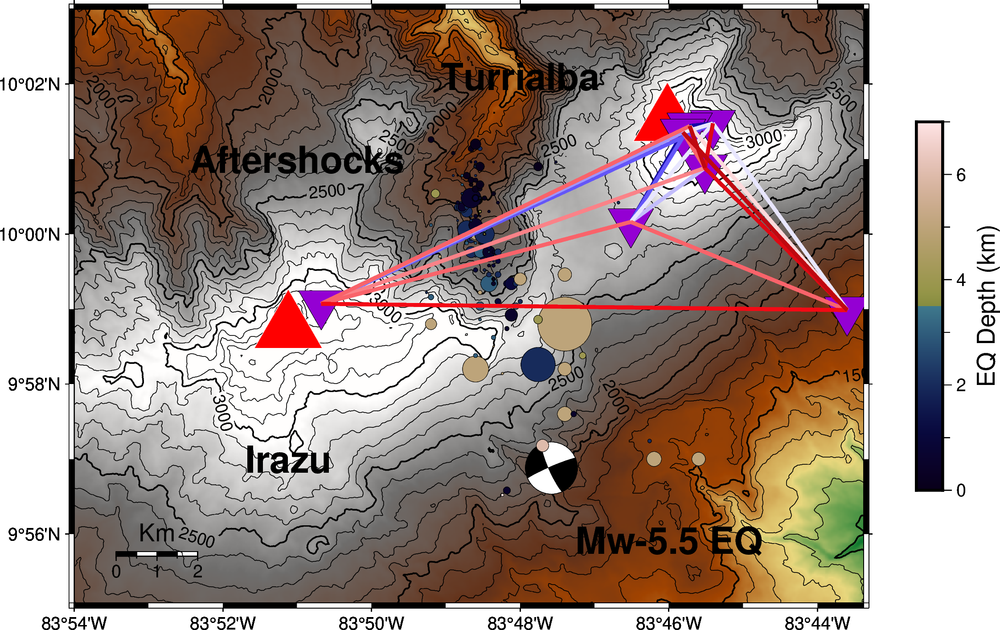

In [121]:
#F3-TT-EQ
data1 = np.array([VTLA+VTUN])
data2 = np.array([VTCE+VTUC])
data3 = np.array([VTUC+VTUN])
data4 = np.array([VICA+VTCE])
data5 = np.array([VTLA+VTUC])
data6 = np.array([VICA+VTUN])
data7 = np.array([VTCG+VTLA])
data8 = np.array([VTCE+VTUN])
data9 = np.array([VTCE+VTCV])
data10 = np.array([VTCE+VTLA])
data11 = np.array([VTCV+VTUC])
data12 = np.array([VICA+VTCG])
data13 = np.array([VTCV+VTLA])
data14 = np.array([VTCG+VTUN])
data15 = np.array([VICA+VTUC])
data16 = np.array([VICA+VTLA])
data17 = np.array([VICA+VTCV])
data18 = np.array([VTCE+VTCG])
data19 = np.array([VTCG+VTCV])
data20 = np.array([VTCV+VTUN])
data21 = np.array([VTCG+VTUC])
#Blues    #Reds
#1507a5  1 #9f060e 1  -1
#1c09e0  1 #bf0810 2  -1
#2d1af5  2 #de0913 3  -2
#311ef6  3 #f30a15 4  -3
#4f3ff7  4 #f6232d 5  -4
#6456f8  5 #f74149 6  -5
#7a6ef9  6 #f9636a 7  -6
#9f96fb  7 #fa8288 8  -7
#c3bdfc  8 #fcacaf 9  -8
#e8e6fe  9 #fdd9db 10 -9
#white #ffffff
#F3-TT-EQ
fig.plot(data=data1, style="=0.4c+s", pen="2p,#1507a5")
fig.plot(data=data2, style="=0.4c+s", pen="2p,#1507a5")
fig.plot(data=data3, style="=0.4c+s", pen="2p,#311ef6")
fig.plot(data=data4, style="=0.4c+s", pen="2p,#6456f8")
fig.plot(data=data5, style="=0.4c+s", pen="2p,#6456f8")
fig.plot(data=data6, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data7, style="=0.4c+s", pen="2p,#c3bdfc")
fig.plot(data=data8, style="=0.4c+s", pen="2p,#e8e6fe")
fig.plot(data=data9, style="=0.4c+s", pen="2p,#e8e6fe")
fig.plot(data=data10, style="=0.4c+s", pen="2p,#e8e6fe")
fig.plot(data=data11, style="=0.4c+s", pen="2p,#fdd9db") #fdd9db
fig.plot(data=data12, style="=0.4c+s", pen="2p,#fa8288")
fig.plot(data=data13, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data14, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data15, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data16, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data17, style="=0.4c+s", pen="2p,#f30a15")
fig.plot(data=data18, style="=0.4c+s", pen="2p,#de0913")
fig.plot(data=data19, style="=0.4c+s", pen="2p,#de0913")
fig.plot(data=data20, style="=0.4c+s", pen="2p,#bf0810")
fig.plot(data=data21, style="=0.4c+s", pen="2p,#bf0810")
fig.show()
fig.savefig(r'/Users/seismo_reynier/Documents/dvvmapF3TTEQplane.png', dpi = 300)

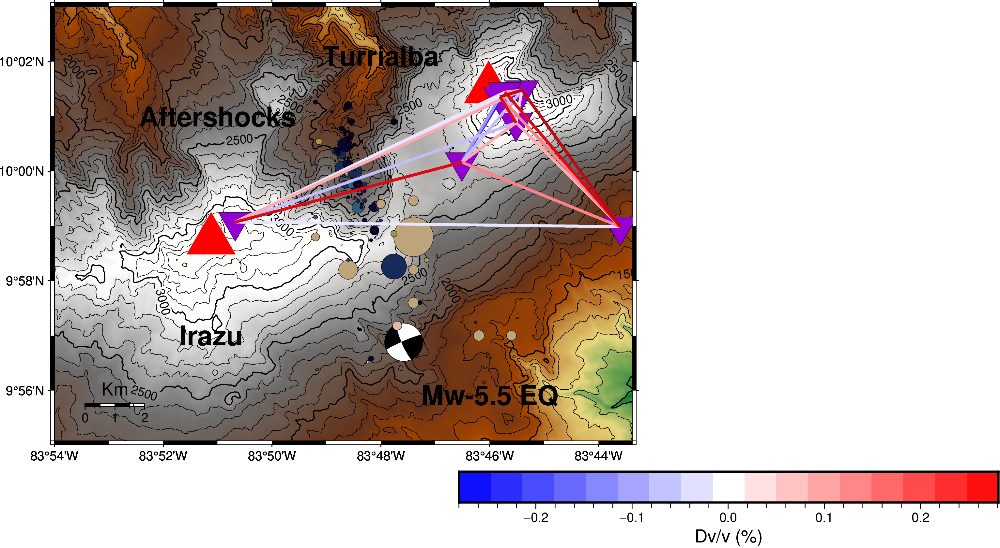

In [113]:
#F3-ZZ-EQ
data1 = np.array([VTLA+VTUC])
data2 = np.array([VTLA+VTUN])
data3 = np.array([VTUC+VTUN])
data4 = np.array([VICA+VTCG])
data5 = np.array([VTCG+VTUC])
data6 = np.array([VTCE+VTLA])
data7 = np.array([VICA+VTCV])
data8 = np.array([VICA+VTUN])
data9 = np.array([VICA+VTUC])
data10 = np.array([VTCE+VTCG])
data11 = np.array([VTCE+VTUC])
data12 = np.array([VTCG+VTCV])
data13 = np.array([VICA+VTCE])
data14 = np.array([VTCG+VTLA])
data15 = np.array([VTCV+VTUN])
data16 = np.array([VTCV+VTLA])
data17 = np.array([VTCG+VTUN])
data18 = np.array([VTCV+VTUC])
data19 = np.array([VICA+VTLA])
data20 = np.array([VTCE+VTCV])
data21 = np.array([VTCE+VTUN])
#Blues    #Reds
#1507a5   #9f060e 1
#1c09e0  1 #bf0810 2  -1
#2d1af5  2 #de0913 3  -2
#311ef6  3 #f30a15 4  -3
#4f3ff7  4 #f6232d 5  -4
#6456f8  5 #f74149 6  -5
#7a6ef9  6 #f9636a 7  -6
#9f96fb  7 #fa8288 8  -7
#c3bdfc  8 #fcacaf 9  -8
#e8e6fe  9 #fdd9db 10 -9
#white #ffffff

#F3-ZZ-EQ
fig.plot(data=data1, style="=0.4c+s", pen="2p,#311ef6")
fig.plot(data=data2, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data3, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data4, style="=0.4c+s", pen="2p,#c3bdfc")
fig.plot(data=data5, style="=0.4c+s", pen="2p,#c3bdfc")
fig.plot(data=data6, style="=0.4c+s", pen="2p,#c3bdfc")
fig.plot(data=data7, style="=0.4c+s", pen="2p,#e8e6fe")
fig.plot(data=data8, style="=0.4c+s", pen="2p,#e8e6fe")
fig.plot(data=data9, style="=0.4c+s", pen="2p,#e8e6fe")
fig.plot(data=data10, style="=0.4c+s", pen="2p,#fdd9db")
fig.plot(data=data11, style="=0.4c+s", pen="2p,#fcacaf")
fig.plot(data=data12, style="=0.4c+s", pen="2p,#fcacaf")
fig.plot(data=data13, style="=0.4c+s", pen="2p,#fcacaf")
fig.plot(data=data14, style="=0.4c+s", pen="2p,#fcacaf")
fig.plot(data=data15, style="=0.4c+s", pen="2p,#fa8288")
fig.plot(data=data16, style="=0.4c+s", pen="2p,#fa8288")
fig.plot(data=data17, style="=0.4c+s", pen="2p,#de0913")
fig.plot(data=data18, style="=0.4c+s", pen="2p,#de0913")
fig.plot(data=data19, style="=0.4c+s", pen="2p,#de0913")
fig.plot(data=data20, style="=0.4c+s", pen="2p,#bf0810")
fig.plot(data=data21, style="=0.4c+s", pen="2p,#bf0810")
fig.show()
fig.savefig(r'/Users/seismo_reynier/Documents/dvvmapF3ZZEQshifted.png', dpi = 300)

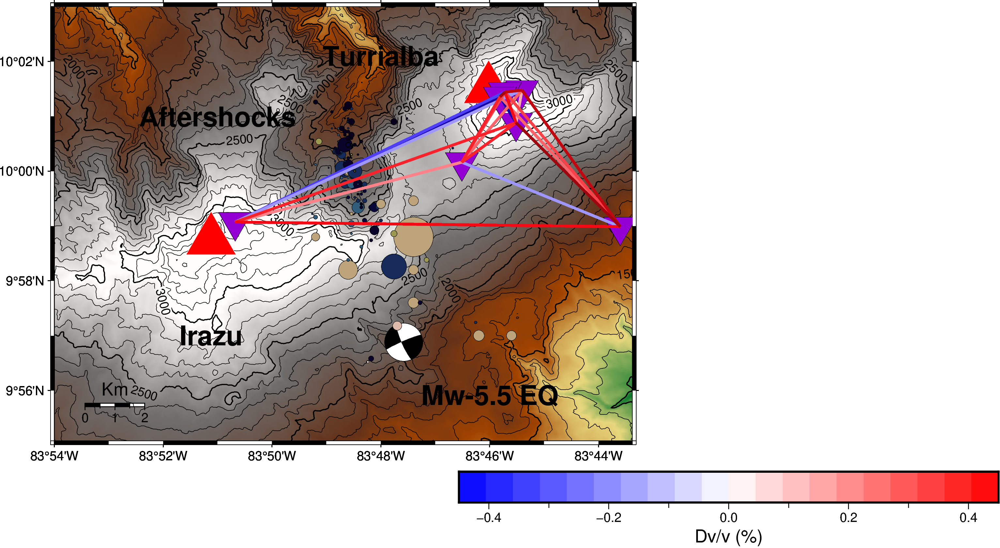

In [144]:
#F3-zz-newerupt
data1 = np.array([VTCG+VTUN])
data2 = np.array([VICA+VTUN])
data3 = np.array([VICA+VTUC])
data4 = np.array([VICA+VTCE])
data5 = np.array([VTCV+VTLA])
data6 = np.array([VTCE+VTUN])
data7 = np.array([VTCE+VTCG])
data8 = np.array([VICA+VTLA])
data9 = np.array([VTCV+VTUN])
data10 = np.array([VTCE+VTLA])
data11 = np.array([VTLA+VTUC])
data12 = np.array([VTCV+VTUC])
data13 = np.array([VTLA+VTUN])
data14 = np.array([VTCG+VTLA])
data15 = np.array([VICA+VTCG])
data16 = np.array([VTCG+VTUC])
data17 = np.array([VICA+VTCV])
data18 = np.array([VTCE+VTCV])
data19 = np.array([VTCE+VTUC])
data20 = np.array([VTUC+VTUN])
data21 = np.array([VTCG+VTCV])
#Blues    #Reds
#1507a5   #9f060e 1
#1c09e0  1 #bf0810 2  -1
#2d1af5  2 #de0913 3  -2
#311ef6  3 #f30a15 4  -3
#4f3ff7  4 #f6232d 5  -4
#6456f8  5 #f74149 6  -5
#7a6ef9  6 #f9636a 7  -6
#9f96fb  7 #fa8288 8  -7
#c3bdfc  8 #fcacaf 9  -8
#e8e6fe  9 #fdd9db 10 -9
#white #ffffff

#F3-ZZ-EQ
fig.plot(data=data1, style="=0.4c+s", pen="2p,#1507a5")
fig.plot(data=data2, style="=0.4c+s", pen="2p,#1507a5")
fig.plot(data=data3, style="=0.4c+s", pen="2p,#4f3ff7")
fig.plot(data=data4, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data5, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data6, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data7, style="=0.4c+s", pen="2p,#fcacaf")
fig.plot(data=data8, style="=0.4c+s", pen="2p,#fa8288")
fig.plot(data=data9, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data10, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data11, style="=0.4c+s", pen="2p,#f74149")
fig.plot(data=data12, style="=0.4c+s", pen="2p,#f74149")
fig.plot(data=data13, style="=0.4c+s", pen="2p,#f6232d")
fig.plot(data=data14, style="=0.4c+s", pen="2p,#f6232d")
fig.plot(data=data15, style="=0.4c+s", pen="2p,#f6232d")
fig.plot(data=data16, style="=0.4c+s", pen="2p,#f30a15")
fig.plot(data=data17, style="=0.4c+s", pen="2p,#f30a15")
fig.plot(data=data18, style="=0.4c+s", pen="2p,#bf0810")
fig.plot(data=data19, style="=0.4c+s", pen="2p,#bf0810")
fig.plot(data=data20, style="=0.4c+s", pen="2p,#9f060e")
fig.plot(data=data21, style="=0.4c+s", pen="2p,#9f060e")
fig.show()
fig.savefig(r'/Users/seismo_reynier/Documents/dvvmapF3zznewerupt.png', dpi = 300)

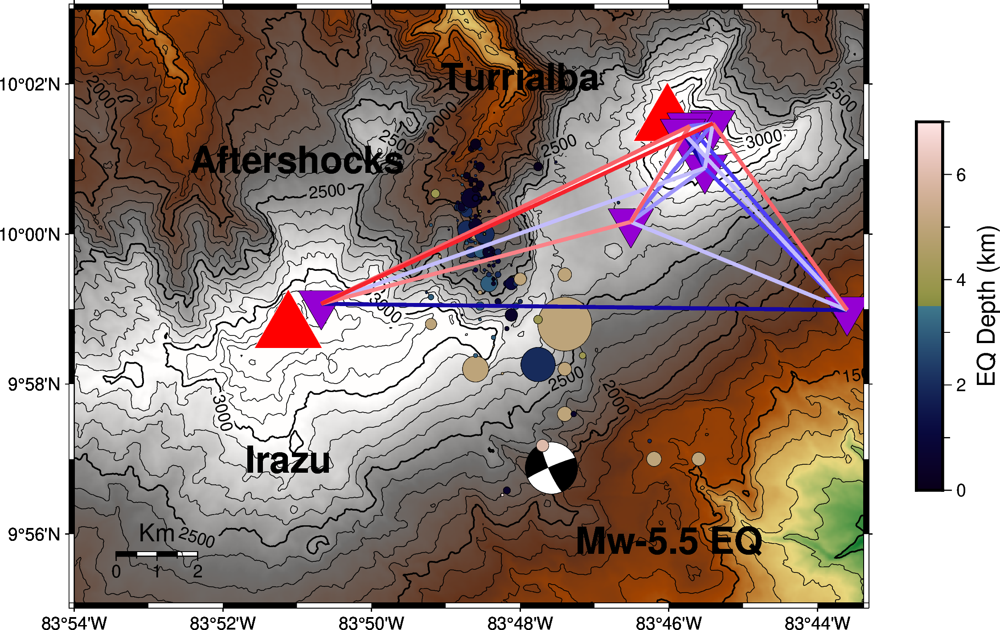

In [150]:
#F3-tt-newerupt
data1 = np.array([VTCG+VTUN])
data2 = np.array([VICA+VTCV])
data3 = np.array([VTUC+VTUN])
data4 = np.array([VTCG+VTCV])
data5 = np.array([VTCV+VTUC])
data6 = np.array([VTCG+VTUC])
data7 = np.array([VTCE+VTLA])
data8 = np.array([VTCE+VTUC])
data9 = np.array([VTCG+VTLA])
data10 = np.array([VTCV+VTUN])
data11 = np.array([VICA+VTCG])
data12 = np.array([VTCV+VTLA])
data13 = np.array([VTCE+VTCG])
data14 = np.array([VTLA+VTUN])
data15 = np.array([VTCE+VTUN])
data16 = np.array([VICA+VTUN])
data17 = np.array([VICA+VTLA])
data18 = np.array([VTCE+VTCV])
data19 = np.array([VTLA+VTUC])
data20 = np.array([VICA+VTUC])
data21 = np.array([VICA+VTCE])
#Blues    #Reds
#1507a5   #9f060e 1
#1c09e0  1 #bf0810 2  -1
#2d1af5  2 #de0913 3  -2
#311ef6  3 #f30a15 4  -3
#4f3ff7  4 #f6232d 5  -4
#6456f8  5 #f74149 6  -5
#7a6ef9  6 #f9636a 7  -6
#9f96fb  7 #fa8288 8  -7
#c3bdfc  8 #fcacaf 9  -8
#e8e6fe  9 #fdd9db 10 -9
#white #ffffff

#F3-ZZ-EQ
fig.plot(data=data1, style="=0.4c+s", pen="2p,#1507a5")
fig.plot(data=data2, style="=0.4c+s", pen="2p,#1507a5")
fig.plot(data=data3, style="=0.4c+s", pen="2p,#1c09e0 ")
fig.plot(data=data4, style="=0.4c+s", pen="2p,#4f3ff7")
fig.plot(data=data5, style="=0.4c+s", pen="2p,#4f3ff7")
fig.plot(data=data6, style="=0.4c+s", pen="2p,#6456f8")
fig.plot(data=data7, style="=0.4c+s", pen="2p,#7a6ef9")
fig.plot(data=data8, style="=0.4c+s", pen="2p,#7a6ef9")
fig.plot(data=data9, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data10, style="=0.4c+s", pen="2p,#c3bdfc")
fig.plot(data=data11, style="=0.4c+s", pen="2p,#c3bdfc")
fig.plot(data=data12, style="=0.4c+s", pen="2p,#c3bdfc")
fig.plot(data=data13, style="=0.4c+s", pen="2p,#c3bdfc")
fig.plot(data=data14, style="=0.4c+s", pen="2p,#e8e6fe")
fig.plot(data=data15, style="=0.4c+s", pen="2p,#e8e6fe")
fig.plot(data=data16, style="=0.4c+s", pen="2p,#ffffff")
fig.plot(data=data17, style="=0.4c+s", pen="2p,#fa8288")
fig.plot(data=data18, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data19, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data20, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data21, style="=0.4c+s", pen="2p,#f6232d")
fig.show()
fig.savefig(r'/Users/seismo_reynier/Documents/dvvmapF3ttnewerupt.png', dpi = 300)

In [ ]:
#F3-zz-newerupt
data1 = np.array([VTCGVTUN])
data2 = np.array([VICA+VTUN])
data3 = np.array([VICA+VTUC])
data4 = np.array([VICA+VTCE])
data5 = np.array([VTCV+VTLA])
data6 = np.array([VTCE+VTUN])
data7 = np.array([VTCE+VTCG])
data8 = np.array([VICA+VTLA])
data9 = np.array([VTCV+VTUN])
data10 = np.array([VTCE+VTLA])
data11 = np.array([VTLA+VTUC])
data12 = np.array([VTCV+VTUC])
data13 = np.array([VTLA+VTUN])
data14 = np.array([VTCG+VTLA])
data15 = np.array([VICA+VTCG])
data16 = np.array([VTCG+VTUC])
data17 = np.array([VICA+VTCV])
data18 = np.array([VTCE+VTCV])
data19 = np.array([VTCE+VTUC])
data20 = np.array([VTUC+VTUN])
data21 = np.array([VTCG+VTCV])
#Blues    #Reds
#1507a5   #9f060e 1
#1c09e0  1 #bf0810 2  -1
#2d1af5  2 #de0913 3  -2
#311ef6  3 #f30a15 4  -3
#4f3ff7  4 #f6232d 5  -4
#6456f8  5 #f74149 6  -5
#7a6ef9  6 #f9636a 7  -6
#9f96fb  7 #fa8288 8  -7
#c3bdfc  8 #fcacaf 9  -8
#e8e6fe  9 #fdd9db 10 -9
#white #ffffff

#F3-ZZ-EQ
fig.plot(data=data1, style="=0.4c+s", pen="2p,#1507a5")
fig.plot(data=data2, style="=0.4c+s", pen="2p,#1507a5")
fig.plot(data=data3, style="=0.4c+s", pen="2p,#4f3ff7")
fig.plot(data=data4, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data5, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data6, style="=0.4c+s", pen="2p,#9f96fb")
fig.plot(data=data7, style="=0.4c+s", pen="2p,#fcacaf")
fig.plot(data=data8, style="=0.4c+s", pen="2p,#fa8288")
fig.plot(data=data9, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data10, style="=0.4c+s", pen="2p,#f9636a")
fig.plot(data=data11, style="=0.4c+s", pen="2p,#f74149")
fig.plot(data=data12, style="=0.4c+s", pen="2p,#f74149")
fig.plot(data=data13, style="=0.4c+s", pen="2p,#f6232d")
fig.plot(data=data14, style="=0.4c+s", pen="2p,#f6232d")
fig.plot(data=data15, style="=0.4c+s", pen="2p,#f6232d")
fig.plot(data=data16, style="=0.4c+s", pen="2p,#f30a15")
fig.plot(data=data17, style="=0.4c+s", pen="2p,#f30a15")
fig.plot(data=data18, style="=0.4c+s", pen="2p,#bf0810")
fig.plot(data=data19, style="=0.4c+s", pen="2p,#bf0810")
fig.plot(data=data20, style="=0.4c+s", pen="2p,#9f060e")
fig.plot(data=data21, style="=0.4c+s", pen="2p,#9f060e")
fig.show()
fig.savefig(r'/Users/seismo_reynier/Documents/dvvmapF3zznewerupt.png', dpi = 300)